**Importing the libraries**

In [1]:
import os
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
import librosa
import seaborn as sns
plt.style.use('ggplot')

import librosa
import librosa.display
import matplotlib.pyplot as plt
from matplotlib.colorbar import Colorbar
import IPython.display as ipd

from keras.models import Sequential
from keras import layers, optimizers, callbacks
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
from sklearn.metrics import confusion_matrix

from IPython.display import Audio
from pydub import AudioSegment, effects
import warnings
warnings.filterwarnings("ignore")

C:\Users\karti\anaconda3\envs\myvenv1\lib\site-packages\pydub\utils.py:170: RuntimeWarning: Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work
  warn("Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work", RuntimeWarning)


In [2]:
train_meta = pd.read_csv('D:\\birdclef-2024\\train_metadata.csv')
ebird_Taxonomy = pd.read_csv('D:\\birdclef-2024\\eBird_Taxonomy_v2021.csv')

In [3]:
# Summary 
def summary(df):
    summry = pd.DataFrame(df.dtypes, columns=['data type'])
    summry['# missing'] = df.isnull().sum().values
    summry['Duplicate'] = df.duplicated().sum()
    summry['# unique'] = df.nunique().values
    desc = pd.DataFrame(df.describe(include='all').transpose())
    summry['min'] = desc['min'].values
    summry['max'] = desc['max'].values
    summry['avg'] = desc['mean'].values
    summry['std dev'] = desc['std'].values
    summry['top value'] = desc['top'].values
    summry['Freq'] = desc['freq'].values

    return summry

In [4]:
summary(train_meta).style.set_caption("**Summary of the Train Data**").\
background_gradient(cmap='Pastel2_r', axis=0). \
set_properties(**{'border': '1.3px dotted', 'color': '', 'caption-side': 'left'})

,data type,# missing,Duplicate,# unique,min,max,avg,std dev,top value,Freq
primary_label,object,0,0,182,nan,nan,nan,nan,zitcis1,500
secondary_labels,object,0,0,491,nan,nan,nan,nan,[],22567
type,object,0,0,918,nan,nan,nan,nan,[''],6188
latitude,float64,378,0,9098,-43.524000,71.964000,32.537040,19.440382,nan,nan
longitude,float64,378,0,9182,-171.765400,177.447800,43.640699,50.191352,nan,nan
scientific_name,object,0,0,182,nan,nan,nan,nan,Cisticola juncidis,500
common_name,object,0,0,182,nan,nan,nan,nan,Zitting Cisticola,500
author,object,0,0,1942,nan,nan,nan,nan,José Carlos Sires,915
license,object,0,0,4,nan,nan,nan,nan,Creative Commons Attribution-NonCommercial-ShareAlike 4.0,22344
rating,float64,0,0,11,0.000000,5.000000,3.843493,1.100840,nan,nan


In [5]:
train_meta.head().style.set_caption("").set_properties(**{'border' : '1.3px dotted', 'color':''})

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,license,rating,url,filename
0,asbfly,[],['call'],39.229700,118.198700,Muscicapa dauurica,Asian Brown Flycatcher,Matt Slaymaker,Creative Commons Attribution-NonCommercial-ShareAlike 3.0,5.000000,https://www.xeno-canto.org/134896,asbfly/XC134896.ogg
1,asbfly,[],['song'],51.403000,104.640100,Muscicapa dauurica,Asian Brown Flycatcher,Magnus Hellström,Creative Commons Attribution-NonCommercial-ShareAlike 3.0,2.500000,https://www.xeno-canto.org/164848,asbfly/XC164848.ogg
2,asbfly,[],['song'],36.331900,127.355500,Muscicapa dauurica,Asian Brown Flycatcher,Stuart Fisher,Creative Commons Attribution-NonCommercial-ShareAlike 4.0,2.500000,https://www.xeno-canto.org/175797,asbfly/XC175797.ogg
3,asbfly,[],['call'],21.169700,70.600500,Muscicapa dauurica,Asian Brown Flycatcher,vir joshi,Creative Commons Attribution-NonCommercial-ShareAlike 4.0,4.000000,https://www.xeno-canto.org/207738,asbfly/XC207738.ogg
4,asbfly,[],['call'],15.544200,73.773300,Muscicapa dauurica,Asian Brown Flycatcher,Albert Lastukhin & Sergei Karpeev,Creative Commons Attribution-NonCommercial-ShareAlike 4.0,4.000000,https://www.xeno-canto.org/209218,asbfly/XC209218.ogg


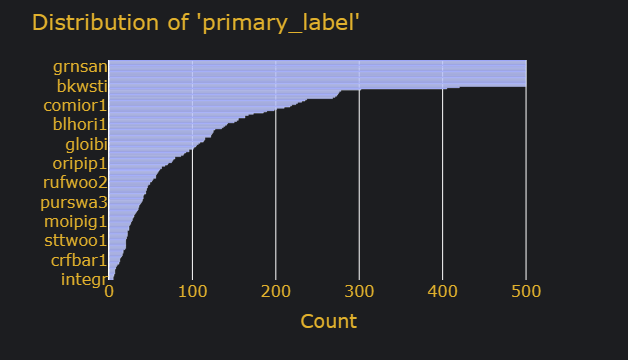


Total unique values in 'primary_label'are: 182

Top 5 values: primary_label
zitcis1    500
lirplo     500
barswa     500
woosan     500
bcnher     500
Name: count, dtype: int64

Bottom 5 values: primary_label
blaeag1    6
wynlau1    6
niwpig1    5
asiope1    5
integr     5
Name: count, dtype: int64


In [6]:
def feature_dist(data, feature):
    # Count unique values
    value_counts = data[feature].value_counts().sort_values(ascending=False)
    
    # Plot
    fig = px.bar(y=value_counts.index[::-1], x=value_counts[::-1], orientation='h')
    fig.update_yaxes(title='')
    fig.update_xaxes(title_text='Count')
    fig.update_layout(
        showlegend=False, 
        plot_bgcolor='#1C1D20', 
        paper_bgcolor='#1C1D20',
        font=dict(size=16, color='#E1B12D'),
        title_font=dict(size=20, color='#222'),
        barmode='group',  
        title=f"Distribution of '{feature}'"
    )
    fig.show()
    print(f"\nTotal unique values in '{feature}'are:",data[feature].nunique())
    print("\nTop 5 values:", value_counts.head())
    print("\nBottom 5 values:", value_counts.tail())
feature_dist(train_meta,'primary_label')

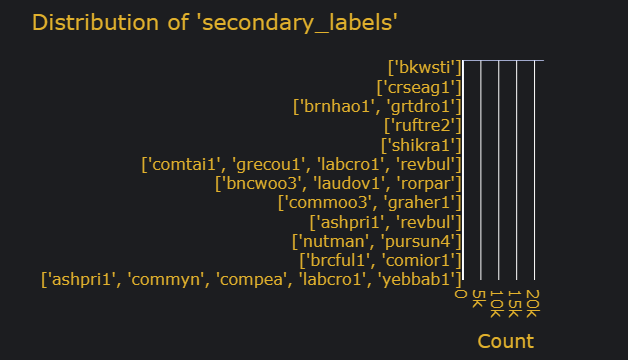


Total unique values in 'secondary_labels'are: 491

Top 5 values: secondary_labels
[]             22567
['houspa']       186
['eucdov']        82
['houcro1']       76
['spodov']        47
Name: count, dtype: int64

Bottom 5 values: secondary_labels
['vefnut1']                                              1
['asikoe2', 'houcro1', 'rocpig']                         1
['copbar1', 'houcro1']                                   1
['commyn', 'houcro1', 'plapri1', 'pursun4', 'revbul']    1
['ashpri1', 'commyn', 'compea', 'labcro1', 'yebbab1']    1
Name: count, dtype: int64


In [7]:
feature_dist(train_meta, 'secondary_labels')

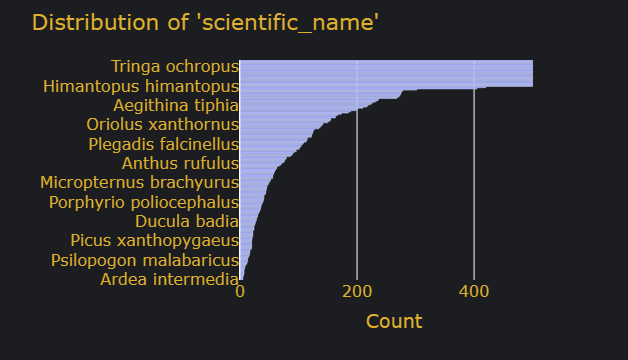


Total unique values in 'scientific_name'are: 182

Top 5 values: scientific_name
Cisticola juncidis       500
Charadrius dubius        500
Hirundo rustica          500
Tringa glareola          500
Nycticorax nycticorax    500
Name: count, dtype: int64

Bottom 5 values: scientific_name
Ictinaetus malaiensis     6
Pterorhinus delesserti    6
Columba elphinstonii      5
Anastomus oscitans        5
Ardea intermedia          5
Name: count, dtype: int64


In [8]:
feature_dist(train_meta, 'scientific_name')

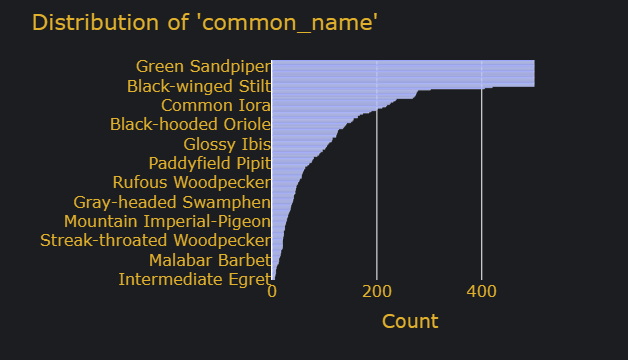


Total unique values in 'common_name'are: 182

Top 5 values: common_name
Zitting Cisticola            500
Little Ringed Plover         500
Barn Swallow                 500
Wood Sandpiper               500
Black-crowned Night-Heron    500
Name: count, dtype: int64

Bottom 5 values: common_name
Black Eagle               6
Wayanad Laughingthrush    6
Nilgiri Wood-Pigeon       5
Asian Openbill            5
Intermediate Egret        5
Name: count, dtype: int64


In [9]:
feature_dist(train_meta, 'common_name')

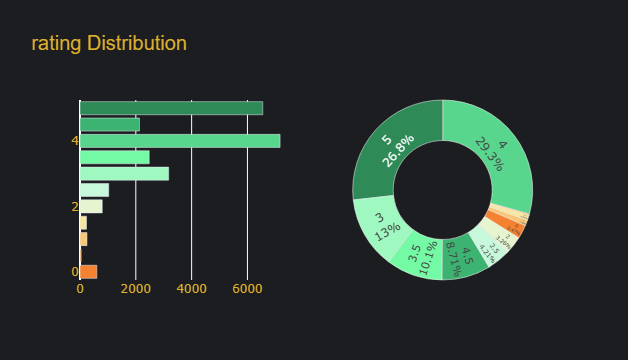

In [10]:
def plot_dist(feature):
    feature_distribution = train_meta[feature].value_counts().sort_index(ascending=False)
    colors = ['#2E8B57', '#3CB371', '#58D68D', '#74F9A4', '#9EF8C0',
              '#C7F8DB', '#E6F5D0', '#F9E79F', '#F7C677', '#F7A54A', '#F58231']
    rating_colors = {rating: color for rating, color in zip(feature_distribution.index, colors)}
    # Bar plot
    bar_data = go.Bar(x=feature_distribution.values, y=feature_distribution.index,
                      orientation='h', marker=dict(color=[rating_colors[rating] for rating in feature_distribution.index]), showlegend=False, name='')

    # Donut chart
    labels = feature_distribution.index.tolist()
    values = feature_distribution.values.tolist()
    total_count = sum(values)
    percentages = [(value / total_count) * 100 for value in values]
    donut_data = go.Pie(labels=labels, values=values, marker=dict(colors=[rating_colors[rating]
                        for rating in feature_distribution.index], line=dict(color='#ffffff', width=0.5)), hole=0.55,showlegend=False, name='', 
                        textinfo='label+percent', hoverinfo='label+percent', textposition='inside')
    fig = make_subplots(rows=1, cols=2, specs=[[{"type": "bar"}, {"type": "pie"}]])
    fig.add_trace(bar_data, row=1, col=1)
    fig.add_trace(donut_data, row=1, col=2)
    fig.update_layout(title=f'{feature} Distribution', plot_bgcolor='#1C1D20', paper_bgcolor='#1C1D20',
                      title_font=dict(size=20, family="Lato, sans-serif"), font=dict(color='#E1B12D'))
    fig.show()
plot_dist("rating")
    

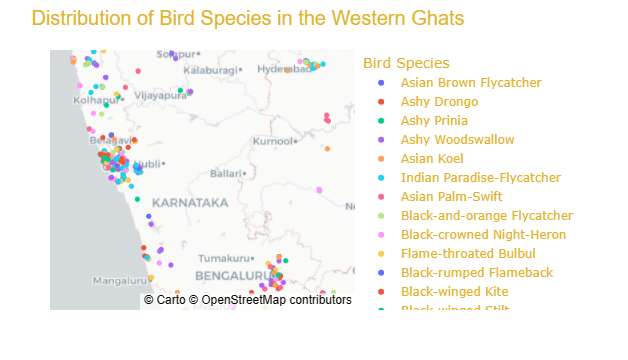

In [11]:
#Lets plot for western ghat
# boundaries for the Western Ghats - as per Google search
lower_latitude = 8
upper_latitude = 22
lower_longitude = 73
upper_longitude = 79
filtered_data = train_meta[(train_meta['latitude'] >= lower_latitude) & 
                           (train_meta['latitude'] <= upper_latitude) &
                           (train_meta['longitude'] >= lower_longitude) &
                           (train_meta['longitude'] <= upper_longitude)]

fig = px.scatter_mapbox(filtered_data, lat="latitude", lon="longitude", color="common_name",
                        zoom=5, center={"lat": (lower_latitude + upper_latitude) / 2, "lon": (lower_longitude + upper_longitude) / 2})
fig.update_layout(title="Distribution of Bird Species in the Western Ghats", plot_bgcolor=None, paper_bgcolor=None,
    title_font=dict(size=20, family="Lato, sans-serif", color='#E1B12D'),  font=dict(color='#E1B12D'),
    mapbox_style="carto-positron", margin=dict(t=50, r=50, b=50, l=50), hovermode='closest',
    showlegend=True, legend=dict(title='Bird Species'), legend_title_font=dict(color='#E1B12D'))
fig.show()

In [13]:
ebird_Taxonomy.head().style.set_caption("").set_properties(**{'border': '1.3px dotted', 'color': ''})

,TAXON_ORDER,CATEGORY,SPECIES_CODE,PRIMARY_COM_NAME,SCI_NAME,ORDER1,FAMILY,SPECIES_GROUP,REPORT_AS
0,1,species,ostric2,Common Ostrich,Struthio camelus,Struthioniformes,Struthionidae (Ostriches),Ostriches,nan
1,6,species,ostric3,Somali Ostrich,Struthio molybdophanes,Struthioniformes,Struthionidae (Ostriches),nan,nan
2,7,slash,y00934,Common/Somali Ostrich,Struthio camelus/molybdophanes,Struthioniformes,Struthionidae (Ostriches),nan,nan
3,8,species,grerhe1,Greater Rhea,Rhea americana,Rheiformes,Rheidae (Rheas),Rheas,nan
4,14,species,lesrhe2,Lesser Rhea,Rhea pennata,Rheiformes,Rheidae (Rheas),nan,nan


In [15]:
summary(ebird_Taxonomy).style.set_caption("**Summary of the Train Data**").\
background_gradient(cmap='Pastel2_r', axis=0). \
set_properties(**{'border': '1.3px dotted', 'color': '', 'caption-side': 'left'})

,data type,# missing,Duplicate,# unique,min,max,avg,std dev,top value,Freq
TAXON_ORDER,int64,0,0,16753,1.000000,35000.000000,16654.013013,10185.185315,nan,nan
CATEGORY,object,0,0,8,nan,nan,nan,nan,species,10824
SPECIES_CODE,object,0,0,16753,nan,nan,nan,nan,ostric2,1
PRIMARY_COM_NAME,object,0,0,16753,nan,nan,nan,nan,Common Ostrich,1
SCI_NAME,object,0,0,16753,nan,nan,nan,nan,Struthio camelus,1
ORDER1,object,2,0,41,nan,nan,nan,nan,Passeriformes,9935
FAMILY,object,13,0,249,nan,nan,nan,nan,Tyrannidae (Tyrant Flycatchers),658
SPECIES_GROUP,object,16537,0,216,nan,nan,nan,nan,Ostriches,1
REPORT_AS,object,12877,0,1400,nan,nan,nan,nan,islthr1,39


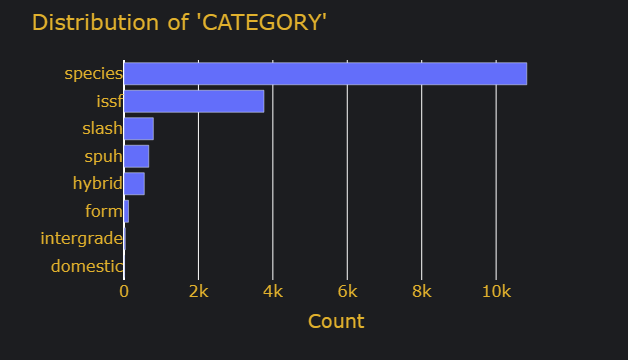


Total unique values in 'CATEGORY'are: 8

Top 5 values: CATEGORY
species    10824
issf        3761
slash        788
spuh         666
hybrid       545
Name: count, dtype: int64

Bottom 5 values: CATEGORY
spuh          666
hybrid        545
form          120
intergrade     34
domestic       15
Name: count, dtype: int64


In [16]:
feature_dist(ebird_Taxonomy,'CATEGORY')

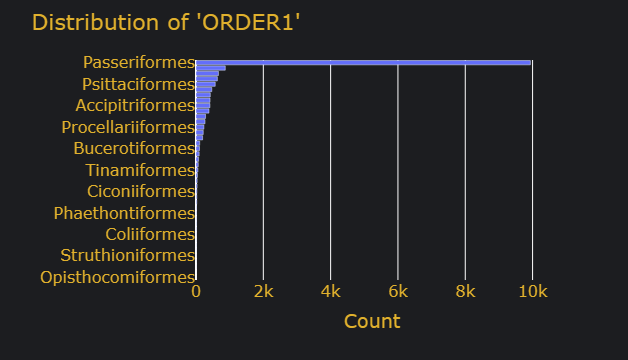


Total unique values in 'ORDER1'are: 41

Top 5 values: ORDER1
Passeriformes       9935
Caprimulgiformes     870
Charadriiformes      667
Piciformes           635
Psittaciformes       571
Name: count, dtype: int64

Bottom 5 values: ORDER1
Struthioniformes     3
Eurypygiformes       2
Cariamiformes        2
Leptosomiformes      1
Opisthocomiformes    1
Name: count, dtype: int64


In [18]:
feature_dist(ebird_Taxonomy,'ORDER1')

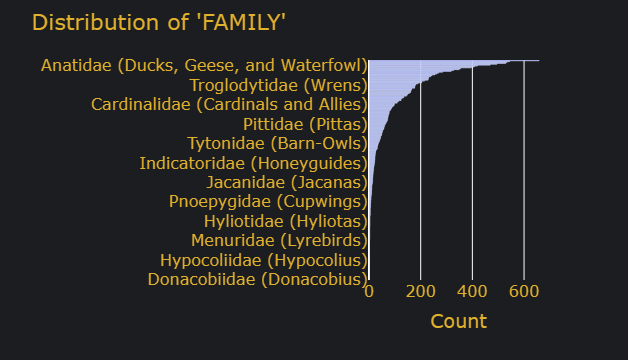


Total unique values in 'FAMILY'are: 249

Top 5 values: FAMILY
Tyrannidae (Tyrant Flycatchers)             658
Thraupidae (Tanagers and Allies)            544
Trochilidae (Hummingbirds)                  533
Muscicapidae (Old World Flycatchers)        529
Furnariidae (Ovenbirds and Woodcreepers)    495
Name: count, dtype: int64

Bottom 5 values: FAMILY
Rhodinocichlidae (Thrush-Tanager)     1
Anseranatidae (Magpie Goose)          1
Pedionomidae (Plains-wanderer)        1
Rhagologidae (Mottled Berryhunter)    1
Donacobiidae (Donacobius)             1
Name: count, dtype: int64


In [19]:
feature_dist(ebird_Taxonomy,'FAMILY')

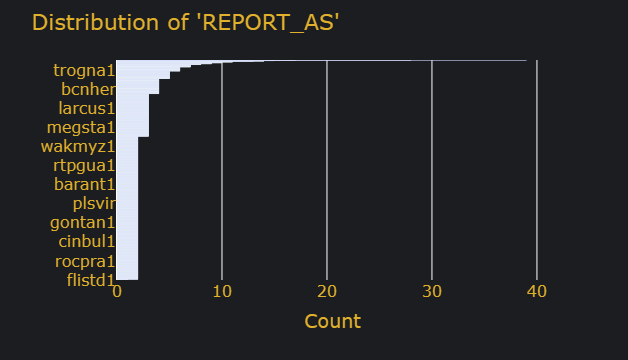


Total unique values in 'REPORT_AS'are: 1400

Top 5 values: REPORT_AS
islthr1    39
redcro     28
eaywag1    17
yeofly1    15
brnowl     14
Name: count, dtype: int64

Bottom 5 values: REPORT_AS
musduc     1
necspi1    1
bkbowl1    1
piewhe1    1
flistd1    1
Name: count, dtype: int64


In [20]:
feature_dist(ebird_Taxonomy,'REPORT_AS')

In [22]:
# Check if the coordinates are within Western Ghats
def is_within_western_ghats(latitude, longitude):
    lower_latitude = 8.0
    upper_latitude = 21.5
    lower_longitude = 73.0
    upper_longitude = 77.5
    return lower_latitude <= latitude <= upper_latitude and lower_longitude <= longitude <= upper_longitude

#Function to plot graphs & print audio file
def visualize_audio_by_bird(common_name, train_meta, audio_path):
    metadata = train_meta[train_meta['common_name'] == common_name]
    if metadata.empty:
        print(f"No data found for the bird species '{common_name}'.")
        return
    
    audio_file = metadata['filename'].iloc[0]
    audio_file_path = f"{audio_path}/{audio_file}"
    latitude = metadata['latitude'].iloc[0]
    
    longitude = metadata['longitude'].iloc[0]
    rating = metadata['rating'].iloc[0]
    author = metadata['author'].iloc[0]
    primary_label = metadata['primary_label'].iloc[0]
    type = metadata['type'].iloc[0]

    # Check if the coordinates are within the Western Ghats
    if not is_within_western_ghats(latitude, longitude):
        print(f"The bird species '{common_name}' does not have recordings in the Western Ghats.")
        return

    try:
        audio_data, sample_rate = librosa.load(audio_file_path)
    except FileNotFoundError:
        print(f"Audio file not found for the bird species '{common_name}'.")
        return

    # Play the audio
    print(f"Playing audio: {common_name}")
    ipd.display(ipd.Audio(audio_data, rate=sample_rate))

    # Create subplots for audio visualizations
    fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(16, 12))
    
    # Waveform
    axs[0, 0].plot(audio_data)
    axs[0, 0].set_title('Waveform')

    # Spectrogram
    spectrogram = librosa.amplitude_to_db(librosa.stft(audio_data), ref=np.max)
    librosa.display.specshow(spectrogram, sr=sample_rate, x_axis='time', y_axis='hz', ax=axs[0, 1])
    axs[0, 1].set_title('Spectrogram')

    # Mel Spectrogram
    mel_spectrogram = librosa.feature.melspectrogram(y=audio_data, sr=sample_rate)
    librosa.display.specshow(mel_spectrogram, x_axis='time', y_axis='mel', sr=sample_rate, ax=axs[1, 0])
    axs[1, 0].set_title('Mel Spectrogram')

    # Chromagram
    chromagram = librosa.feature.chroma_stft(y=audio_data, sr=sample_rate)
    librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma', sr=sample_rate, ax=axs[1, 1])
    axs[1, 1].set_title('Chromagram')

    # MFCCs
    mfccs = librosa.feature.mfcc(y=audio_data, sr=sample_rate)
    librosa.display.specshow(mfccs, x_axis='time', sr=sample_rate, ax=axs[2, 0])
    axs[2, 0].set_title('MFCCs')
    
    # Spectral Contrast
    spectral_contrast = librosa.feature.spectral_contrast(y=audio_data, sr=sample_rate)
    librosa.display.specshow(spectral_contrast, x_axis='time', sr=sample_rate, ax=axs[2, 1])
    axs[2, 1].set_title('Spectral Contrast')
    # Add color bar to the spectrogram plot
    cbar = fig.colorbar(axs[0, 1].collections[0], ax=axs[0, 1], format='%+2.0f dB')

    # Print metadata
    print(f"Common Name: {common_name}")
    print(f"Rating: {rating}")
    print(f"Primary Label: {primary_label}")
    print(f"Type: {type}")
    print(f"Author: {author}")
    print(f"Latitude: {latitude}")
    print(f"Longitude: {longitude}")

    # Plot recordings on map
    fig_map = px.scatter_mapbox(metadata, lat="latitude", lon="longitude", zoom=5, title="Recordings Map",
                                hover_name="filename")
    fig_map.update_layout(mapbox_style="open-street-map")
    fig_map.show()

Playing audio: Nilgiri Wood-Pigeon


Common Name: Nilgiri Wood-Pigeon
Rating: 2.0
Primary Label: niwpig1
Type: ['call']
Author: Dipu Karuthedathu
Latitude: 10.2381
Longitude: 77.4892


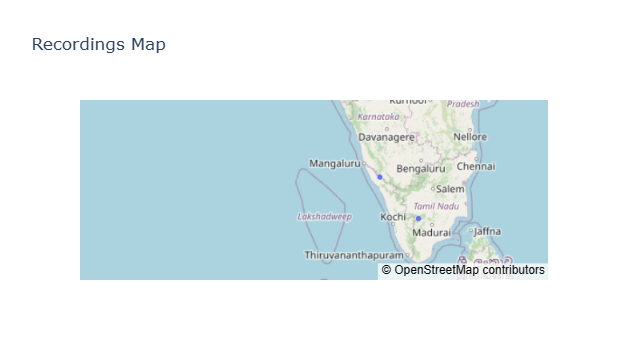

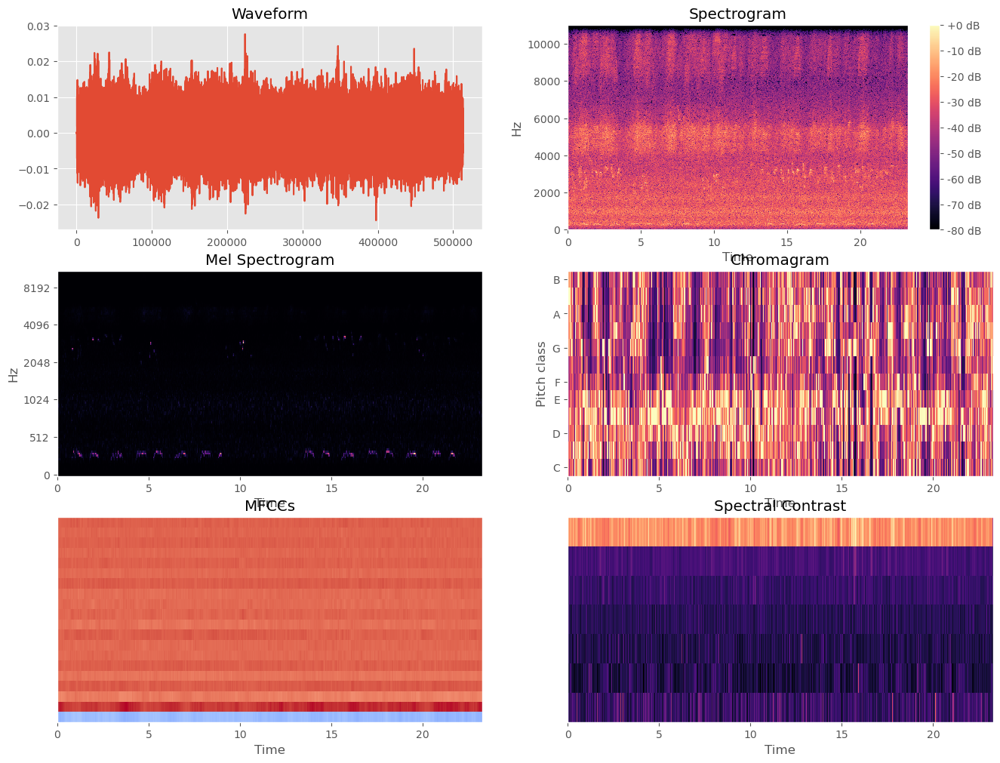

In [26]:
#Check if any specified does not have recording at lat & long of Western Ghat
visualize_audio_by_bird('Nilgiri Wood-Pigeon', train_meta, 'D:\\birdclef-2024\\train_audio')

Playing audio: Malabar Gray Hornbill


Common Name: Malabar Gray Hornbill
Rating: 2.5
Primary Label: maghor2
Type: ['']
Author: Meena Haribal
Latitude: 15.9536
Longitude: 73.9979


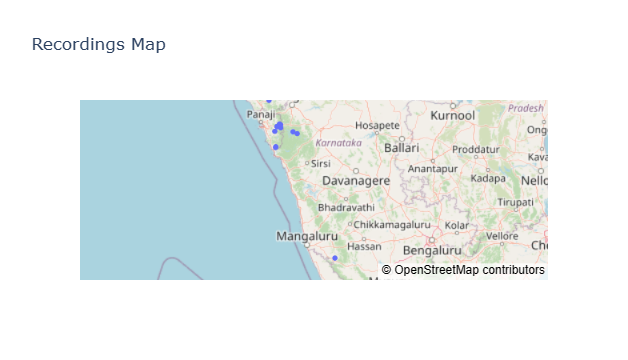

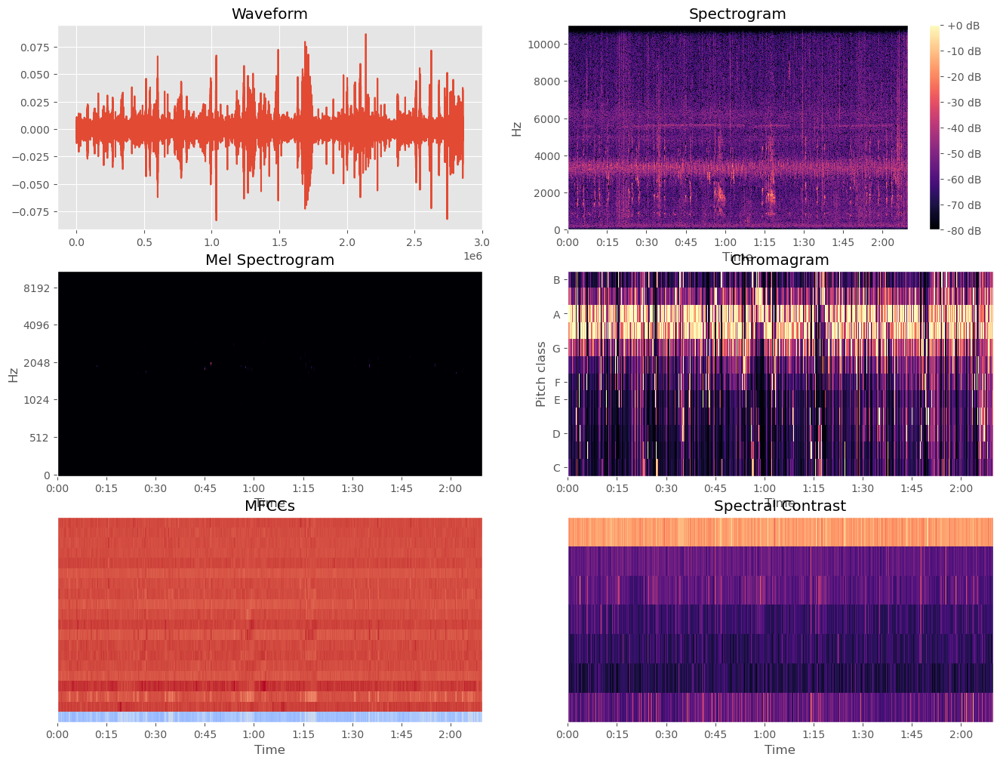

In [27]:
visualize_audio_by_bird('Malabar Gray Hornbill', train_meta, 'D:\\birdclef-2024\\train_audio')